In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
import tensorflow
import os
print(tensorflow.__version__)

2.7.0


In [ ]:
!pip install tf_slim #1.1.0

     |████████████████████████████████| 352 kB 41.3 MB/s 


In [ ]:
!git clone --quiet https://github.com/tensorflow/models.git

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/data_.zip" -d "/content/"

In [ ]:
import os
import shutil
import glob
import urllib
import tarfile
from requests import get

In [ ]:
# Move Config file to directory "models"
shutil.move("/content/models/research/object_detection/samples/configs/ssd_mobilenet_v1_coco.config", "/content/models") 

'/content/models/ssd_mobilenet_v1_coco.config'

In [ ]:
%cd /content/models/research/
!protoc object_detection/protos/*.proto --python_out=.
#!export PYTHONPATH=$PYTHONPATH: /usr/local/lib/python3.6/dist-packages/tensorflow/models/research/:/usr/local/lib/python3.6/dist-packages/tensorflow/models/research/slim
#!pwd
#!python /usr/local/lib/python3.6/dist-packages/tensorflow/models/research/object_detection/builders/model_builder_test.py
#!python setup.py build
import os
os.environ['PYTHONPATH'] += ':/content/models/research/:/content/models/research/slim/:/content/models/research/object_detection/utils/:/content/models/research/object_detection'

# Edit Pipeline 
import tensorflow as tf
from google.protobuf import text_format
from object_detection.protos import pipeline_pb2

pipeline = pipeline_pb2.TrainEvalPipelineConfig()                                                                                                                                                                                                          
config_path = '/content/models/ssd_mobilenet_v1_coco.config'
with tf.gfile.GFile( config_path, "r") as f:                                                                                                                                                                                                                     
    proto_str = f.read()                                                                                                                                                                                                                                          
    text_format.Merge(proto_str, pipeline)

pipeline.train_input_reader.tf_record_input_reader.input_path[:] = ['/content/data_/train.record'] 
pipeline.train_input_reader.label_map_path = '/content/data_/label_map.pbtxt'
pipeline.eval_input_reader[0].tf_record_input_reader.input_path[:] = ['/content/data_/test.record'] 
pipeline.eval_input_reader[0].label_map_path = '/content/data_/label_map.pbtxt'
pipeline.train_config.fine_tune_checkpoint = '/content/models/pretrained_model/model.ckpt'
pipeline.train_config.num_steps = 500
pipeline.model.ssd.num_classes = 1
pipeline.eval_config.num_examples = 5

config_text = text_format.MessageToString(pipeline)                                                                                                                                                                                                        
with tf.gfile.Open( config_path, "wb") as f:                                                                                                                                                                                                                       
    f.write(config_text)

/content/models/research


In [ ]:
import pathlib
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

import tensorflow as tf

from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
# This is needed to display the images.
%matplotlib inline

In [ ]:
# What model to download.
# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = '/content/drive/MyDrive/Colab Notebooks/frozen_inference_graph.pb' #'/content/models/fine_tuned_model' + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
# Upload from local PC
PATH_TO_LABELS = '/content/text_label.pbtxt' #'/content/data_/label_map.pbtxt'

NUM_CLASSES = 1

In [ ]:
print(PATH_TO_CKPT)

/content/drive/MyDrive/Colab Notebooks/frozen_inference_graph.pb


In [ ]:
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [ ]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [ ]:
print(category_index)

{1: {'id': 1, 'name': 'Crane'}}


In [ ]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  if image.getdata().mode == "RGBA":
    image = image.convert('RGB')
  np_array = np.array(image.getdata())
  reshaped = np_array.reshape((im_height, im_width, 3))
  return reshaped.astype(np.uint8)

#NOTE: image with (240, 160, 3) is a RGB image while image with (240, 160, 4) ia a RGBA
"""
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)
"""

'\ndef load_image_into_numpy_array(image):\n  (im_width, im_height) = image.size\n  return np.array(image.getdata()).reshape(\n      (im_height, im_width, 3)).astype(np.uint8)\n'

In [ ]:
PATH_TO_TEST_IMAGES_DIR = '/content/data_/test'
#TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.jpg'.format(i)) for i in range(1, 7) ]
TEST_IMAGE_PATHS = []
path = os.listdir(PATH_TO_TEST_IMAGES_DIR)
for i, files in enumerate(path):
  f_name, f_ext = os.path.splitext(files)
  if f_ext == '.jpg':
    file_name = f_name + f_ext
    TEST_IMAGE_PATHS.append(file_name)

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

In [ ]:
print(TEST_IMAGE_PATHS)

['fa85671c-57_crane.jpg', 'fee651b9-269_crane.jpg', 'ef7623b7-140_crane.jpg', 'f59a6f02-212_crane.jpg', 'f1894b02-53_crane.jpg', 'e7306090-346_crane.jpg', 'ea693a5c-477_crane.jpg', 'f9286c66-373_crane.jpg', 'ffb99936-258_crane.jpg', 'f1d02609-63_crane.jpg', 'fbc4ef0b-206_crane.jpg', 'ed79a488-73_crane.jpg', 'fbe7999e-22_crane.jpg', 'f0e01650-120_crane.jpg', 'ec5bb44f-470_crane.jpg', 'ed7d972e-451_crane.jpg', 'fda29022-196_crane.jpg', 'f7979868-332_crane.jpg', 'e3384303-7_crane.jpg', 'efdcc874-150_crane.jpg', 'f6a8349d-21_crane.jpg', 'ea47e79b-210_crane.jpg', 'f644e6b9-94_crane.jpg', 'f0d8406a-256_crane.jpg', 'f8a50ab0-97_crane.jpg', 'f8785c8b-135_crane.jpg', 'f104abe1-456_crane.jpg', 'ead8f105-278_crane.jpg', 'fa638e30-458_crane.jpg', 'eb6ff3b7-464_crane.jpg', 'e7131772-438_crane.jpg', 'ef231675-88_crane.jpg', 'eca7c5f9-75_crane.jpg', 'fd5207a4-370_crane.jpg', 'ef126499-387_crane.jpg', 'e1876688-62_crane.jpg', 'ee044fbd-28_crane.jpg', 'f9313f68-44_crane.jpg', 'ee52ef59-79_crane.jpg', '

In [ ]:
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


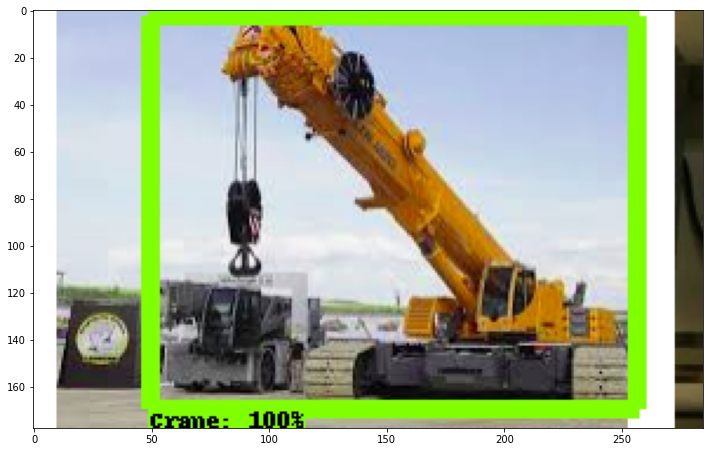

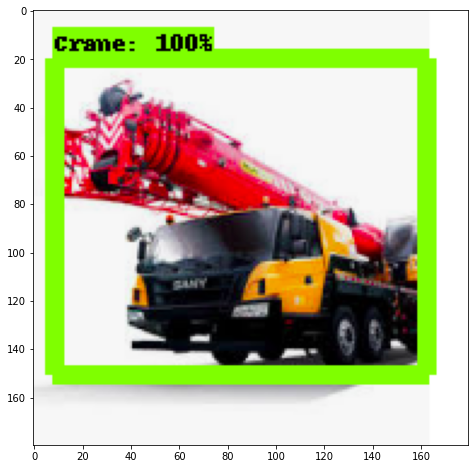

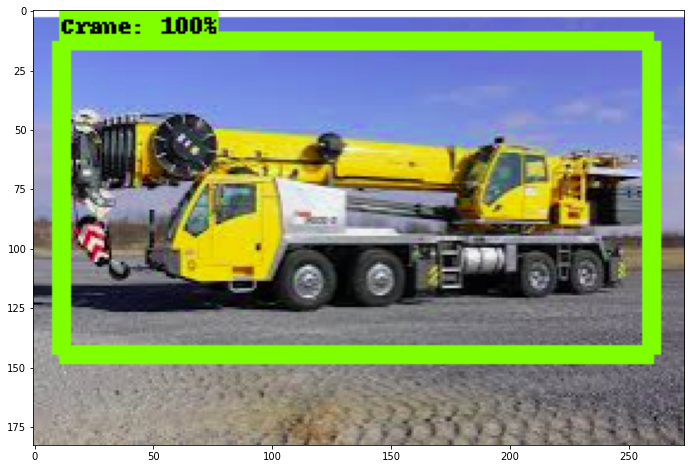

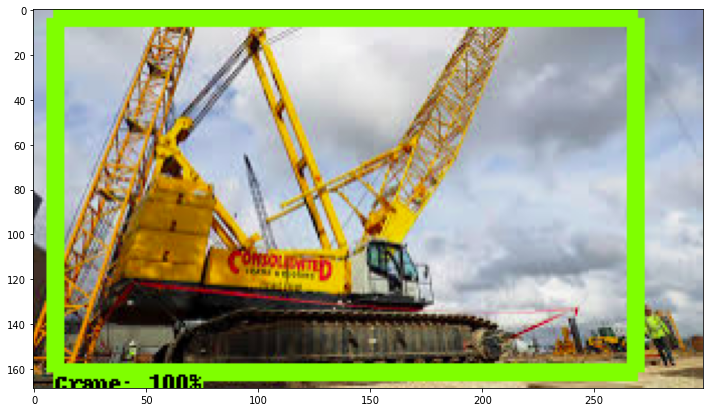

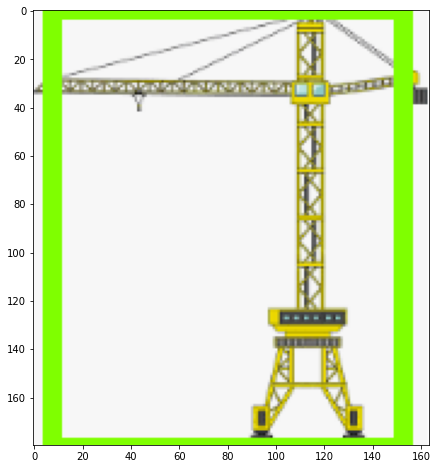

...

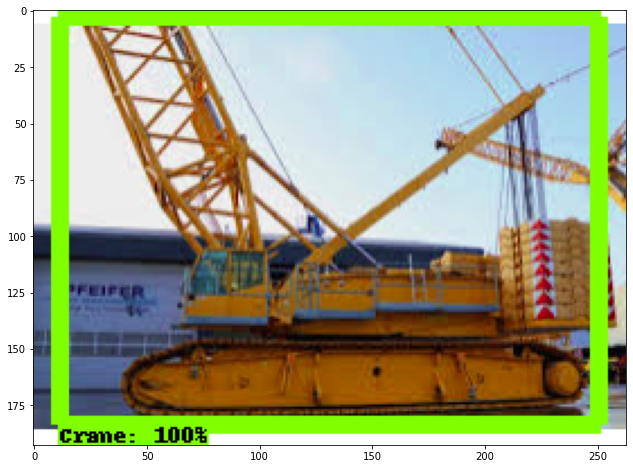

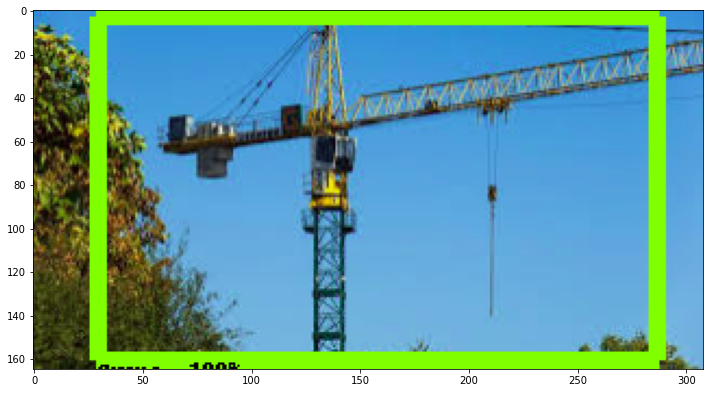

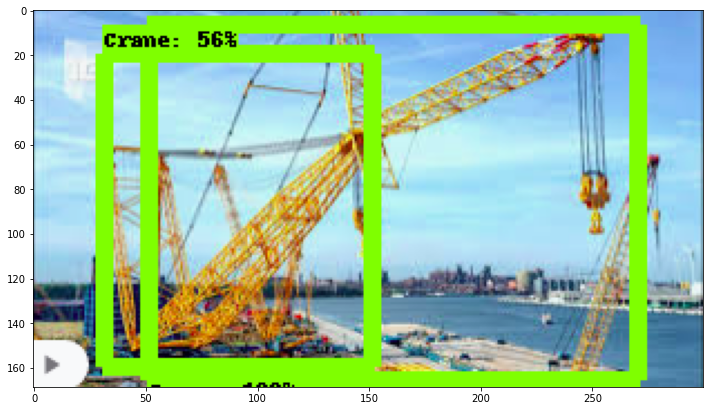

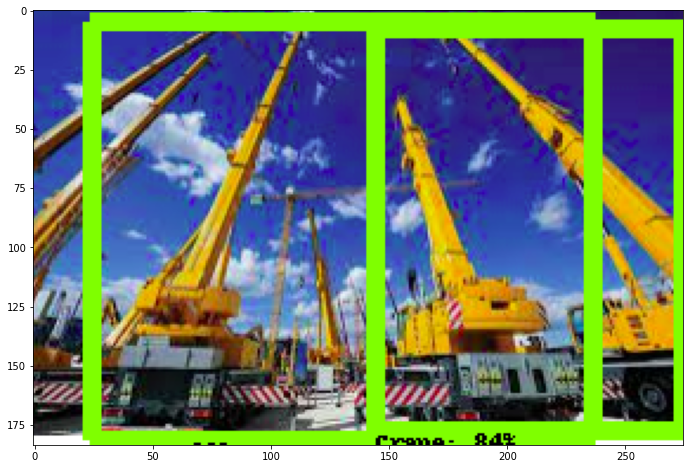

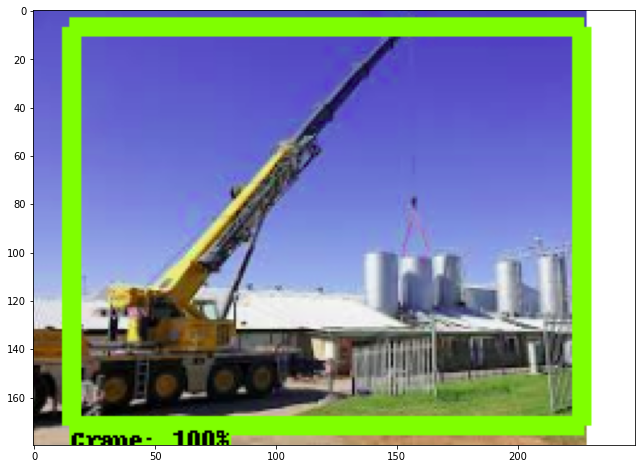

In [ ]:
for image_path in TEST_IMAGE_PATHS:
  image = Image.open(os.path.join("/content/data_/test/", image_path))
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)